# Computer Vision Histograms

### Import statements

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_day4 = cv2.imread('img/day4.jpg')
img_day3 = cv2.imread('img/day3.jpg')

def ip(img_print):
    if len(img_print.shape) == 2:
        plt.figure(figsize=(15,10))
        plt.imshow(img_print, cmap='gray')
    else:
        plt.figure(figsize=(15,10))
        plt.imshow(img_print[:,:,::-1])
    print(img_print.shape)
    
def hsvp(img_print):
    x =cv2.cvtColor(img_print, cv2.COLOR_HSV2RGB)
    plt.figure(figsize=(15,10))
    plt.imshow(x)

## Histograms

(633, 950, 3)


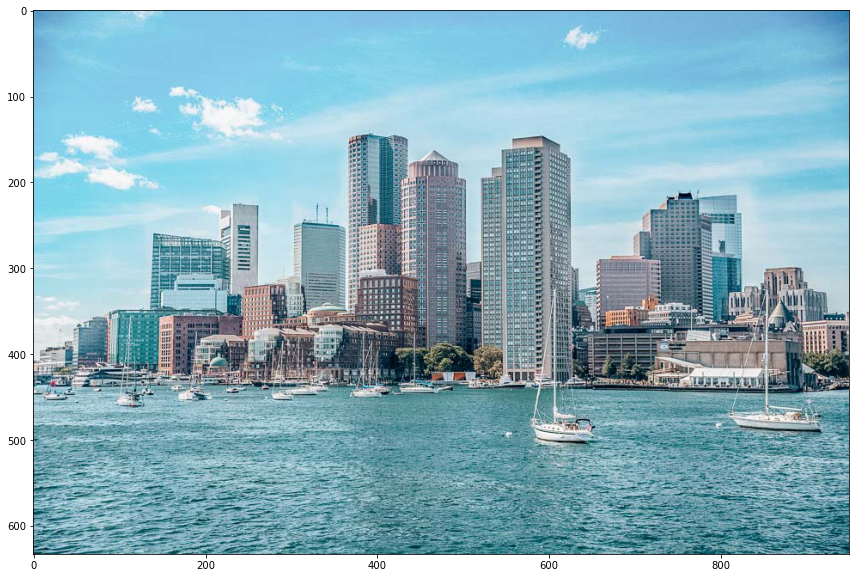

In [2]:
# Load some images, calculate and plot their color histograms, one color at the time
# try it with different color spaces BGR, HSV, etc
ip(img_day3)

[Hint](# "cv2.calcHist") 


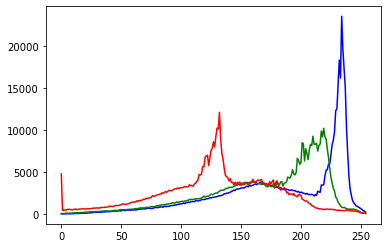

In [21]:
# Now try to plot all 3 channels at the same time, does the histogram give you an idea of what the image looks like?


bgr_blue = cv2.calcHist([img_day3],[0],None, [255],[0,255])
bgr_green = cv2.calcHist([img_day3],[1],None, [255],[0,255])
bgr_red = cv2.calcHist([img_day3],[2],None, [255],[0,255])
plt.plot(bgr_blue,color='b')
plt.plot(bgr_green,color='g')
plt.plot(bgr_red,color='r')
    #
    # colors = ['b','g','r']
    # for i, color in enumerate(colors):
    #     histogram= cv2.calcHist([img_ori],[i],None, [255],[0,255])
    #     plt.plot(histogram, color=color)
    #     plt.xlim(0,256)
    # plt.show()

## Mini project

### Level 1

#### Image classifier

1. By using only computer vision techniques (no Neural Networks and ML are not allowed) create a binary classifier that can detect if a picutre was taken during the day, you can use the images day/night in the img folder or feel free to add your own images.

4.png		      day2.jpg	  night3.png  purple-flowers.jpg  thesea.jpg
blue-flowers.jpg      day3.jpg	  night4.jpg  scan.jpg
blue-red-flowers.png  day4.jpg	  noisy.png   seamask.jpg
clean-text.jpg	      night1.jpg  notes.png   sketch.png
day1.jpg	      night2.jpg  n.png       text.png


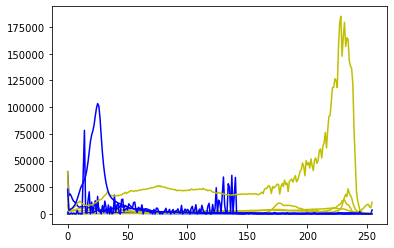

In [18]:
!ls img
am_paths = ['day1.jpg','day2.jpg','day3.jpg','day4.jpg']
pm_paths = ['night1.jpg', 'night2.jpg', 'night3.png', 'night4.jpg']
am_images = [cv2.imread("img/"+img)for img in am_paths]
pm_images = [cv2.imread("img/"+img) for img in pm_paths]



#### BLUES
for DAY, NIGHT in zip(am_images,pm_images):
    day = cv2.calcHist([DAY],[0],None, [255],[0,255])
    night = cv2.calcHist([NIGHT],[0],None, [255],[0,255])
    plt.plot(day,color='y')
    plt.plot(night, color='b')
plt.show()

(752, 1129, 3)
(428, 760, 3)
(683, 1024, 3)
(486, 740, 3)
(633, 950, 3)
(760, 1140, 3)
(2160, 3840, 3)
(1200, 1600, 3)


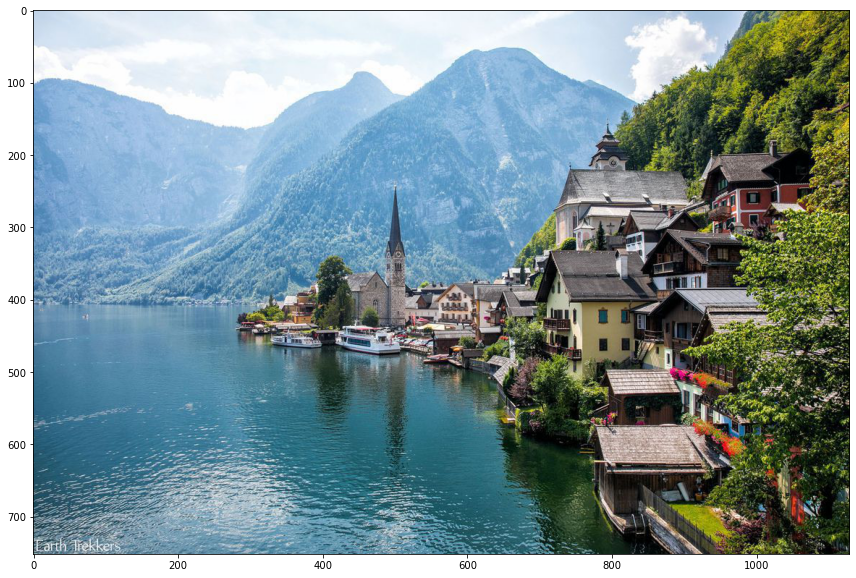

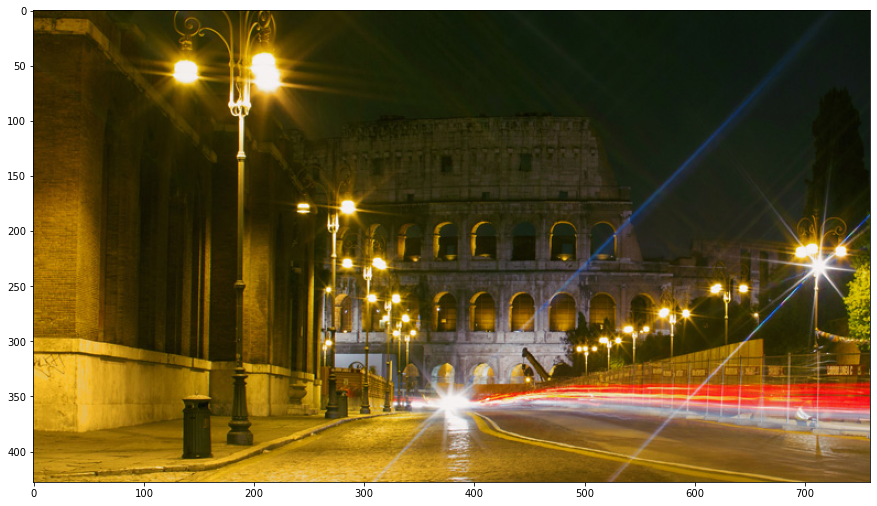

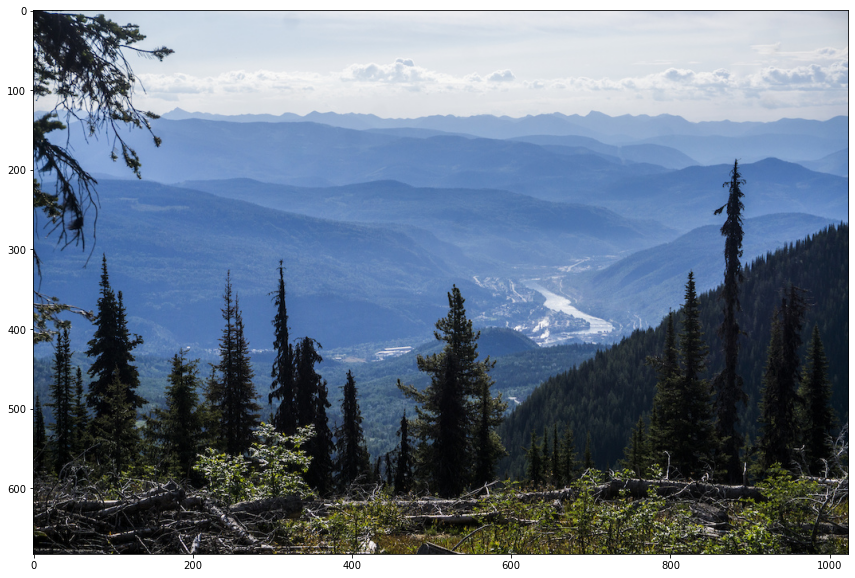

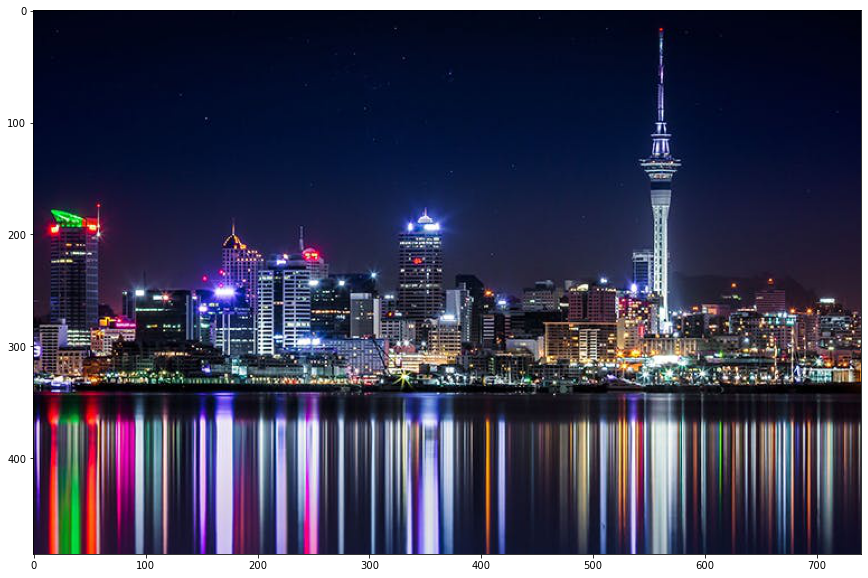

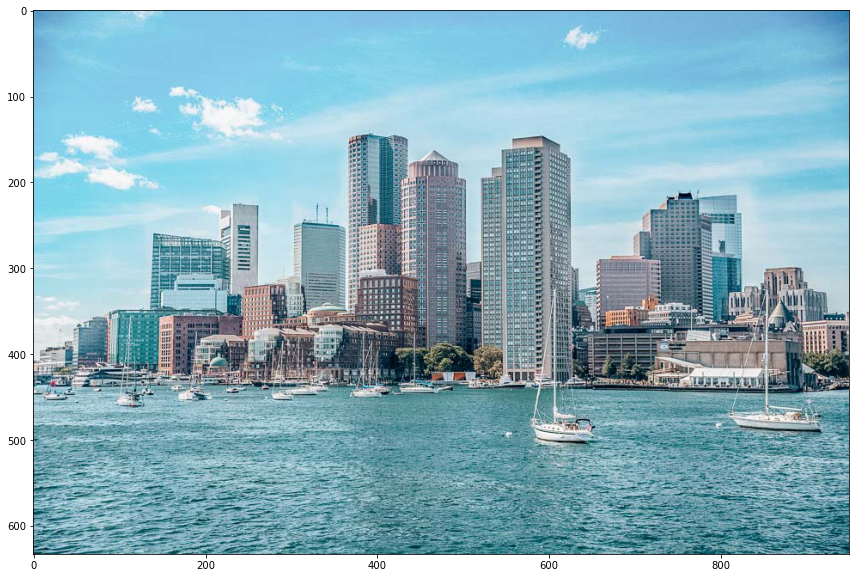

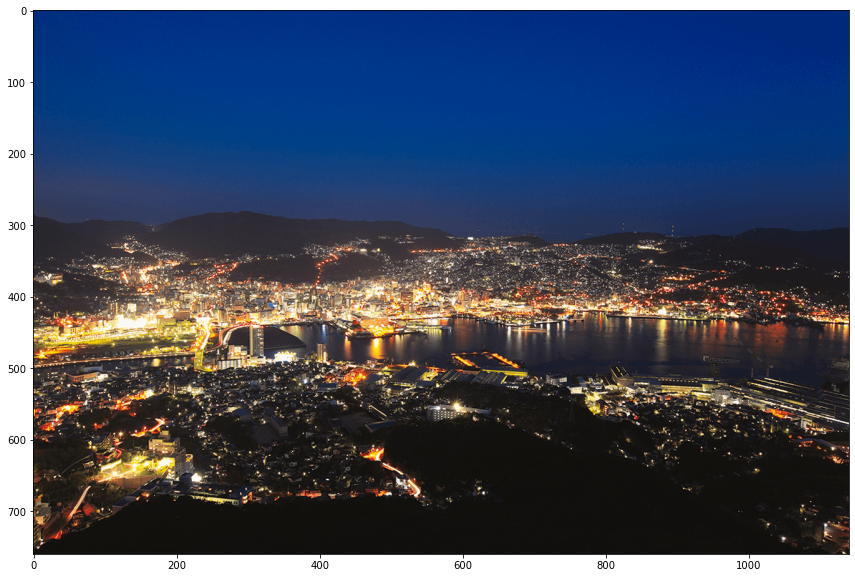

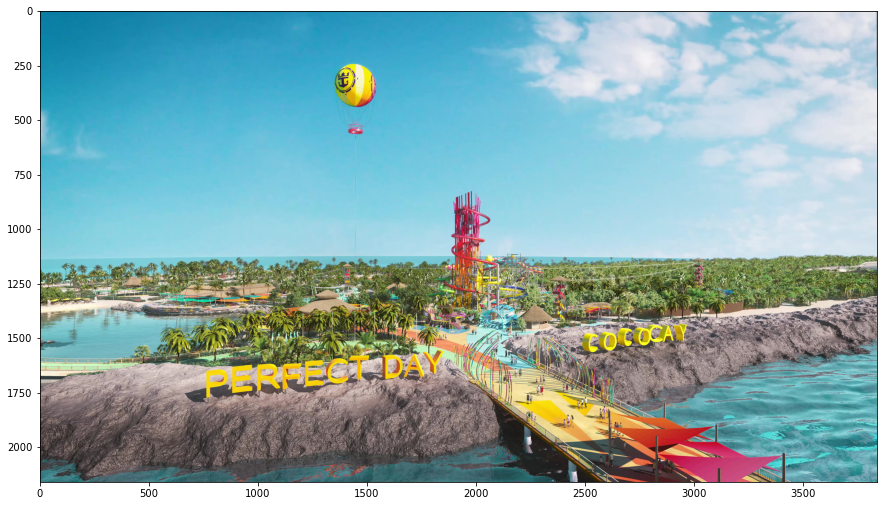

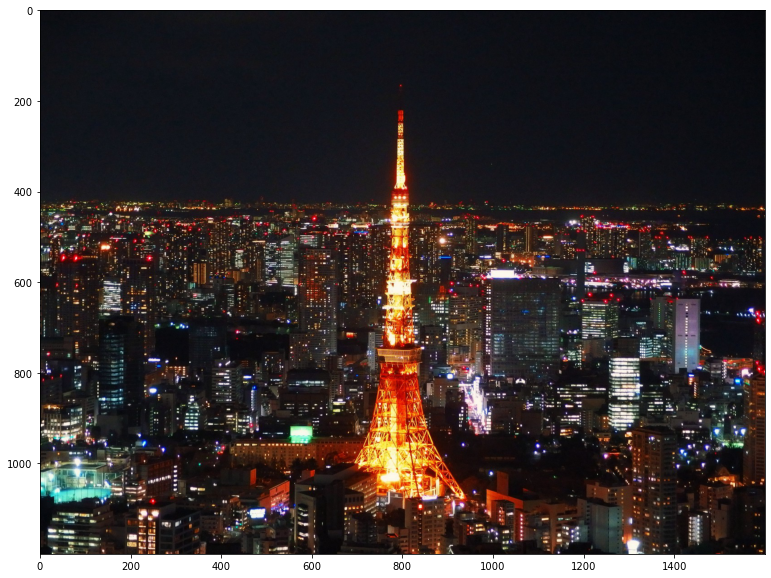

In [20]:
for i in range(len(pm_images)):
    ip(am_images[i])
    ip(pm_images[i])

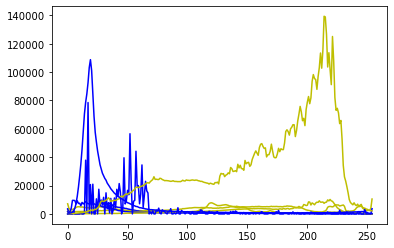

In [22]:
#### GREENS
for DAY, NIGHT in zip(am_images,pm_images):
    day = cv2.calcHist([DAY],[1],None, [255],[0,255])
    night = cv2.calcHist([NIGHT],[1],None, [255],[0,255])
    plt.plot(day,color='y')
    plt.plot(night, color='b')
plt.show()

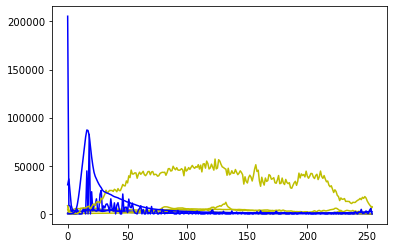

In [23]:
#### REDS
for DAY, NIGHT in zip(am_images,pm_images):
    day = cv2.calcHist([DAY],[2],None, [255],[0,255])
    night = cv2.calcHist([NIGHT],[2],None, [255],[0,255])
    plt.plot(day,color='y')
    plt.plot(night, color='b')
plt.show()

(752, 1129)
(683, 1024)
(633, 950)
(2160, 3840)


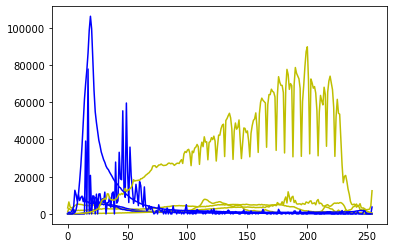

In [41]:
##### GRAYSCALE
gs_am = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in am_images]
gs_pm = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in pm_images]

for DAY, NIGHT in zip(gs_am, gs_pm):
    print(DAY.shape)
    day = cv2.calcHist([DAY],[0],None, [255],[0,255])
    night = cv2.calcHist([NIGHT],[0],None, [255],[0,255])
    plt.plot(day,color='y')
    plt.plot(night, color='b')

(752, 1129, 3)
It's Day time
(683, 1024, 3)
It's Day time
(633, 950, 3)
It's Day time
(2160, 3840, 3)
It's Day time
(428, 760, 3)
It's Night time
(486, 740, 3)
It's Night time
(760, 1140, 3)
It's Night time
(1200, 1600, 3)
It's Night time


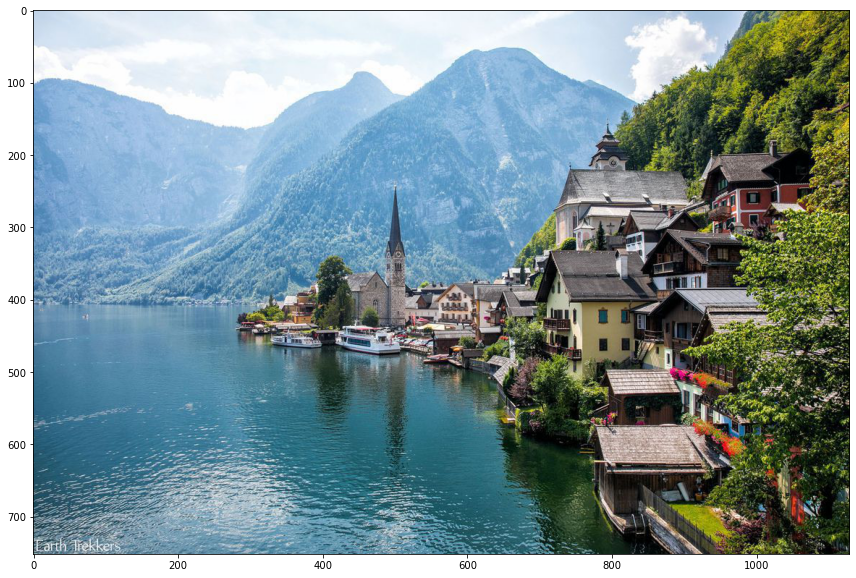

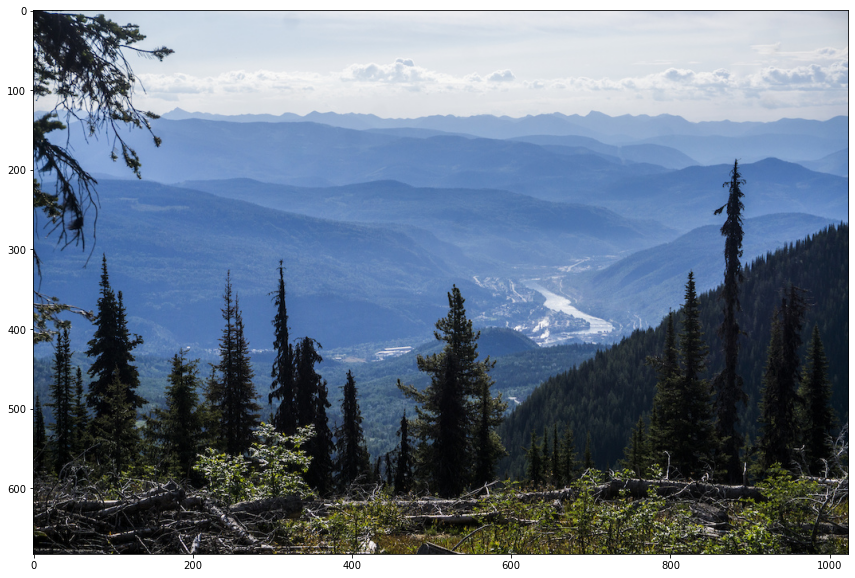

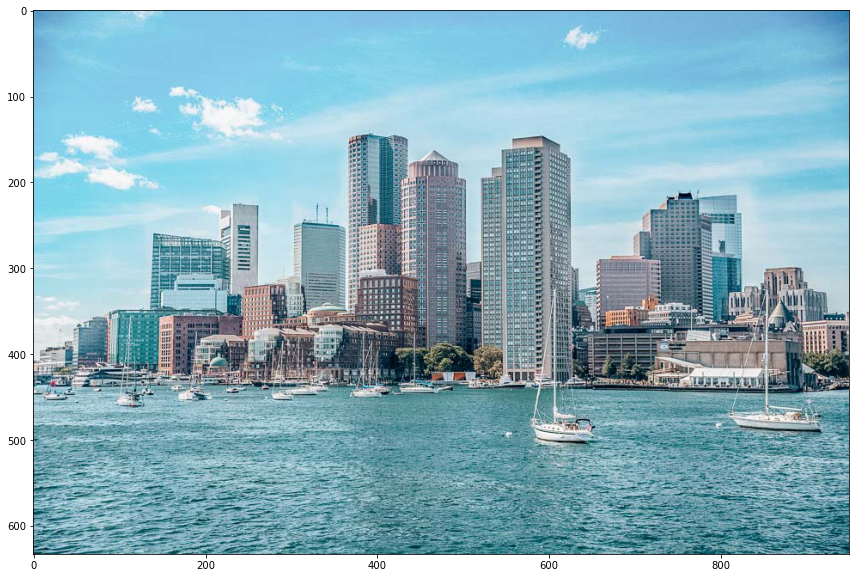

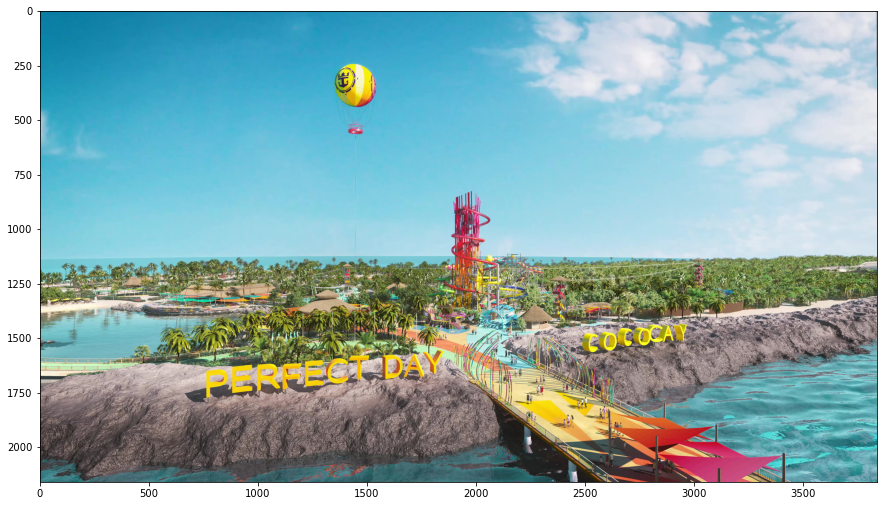

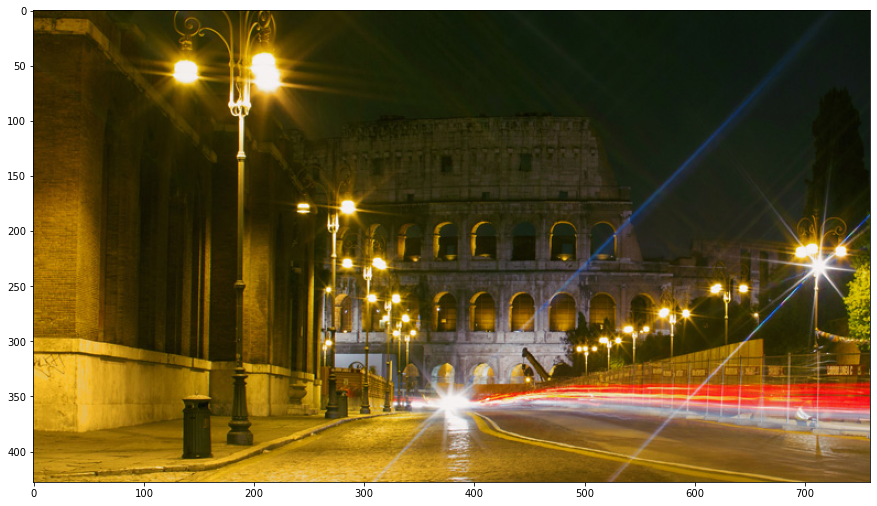

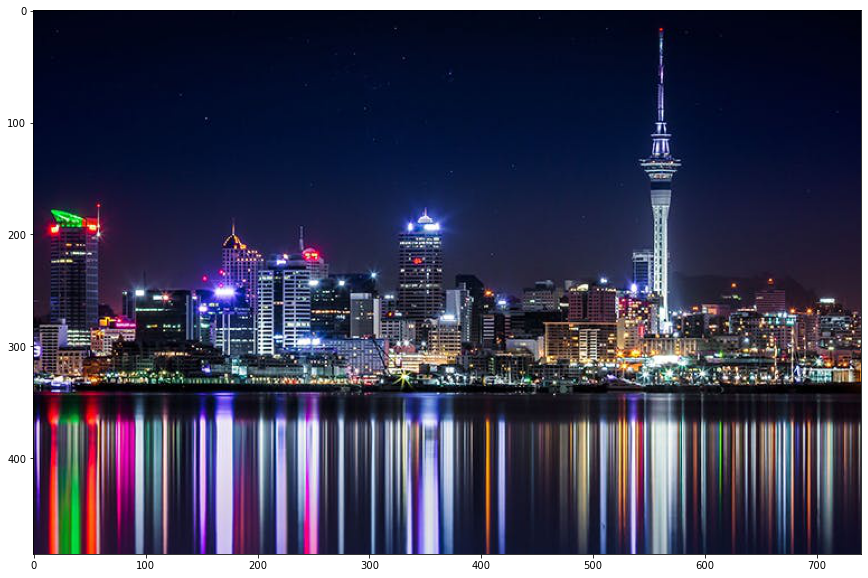

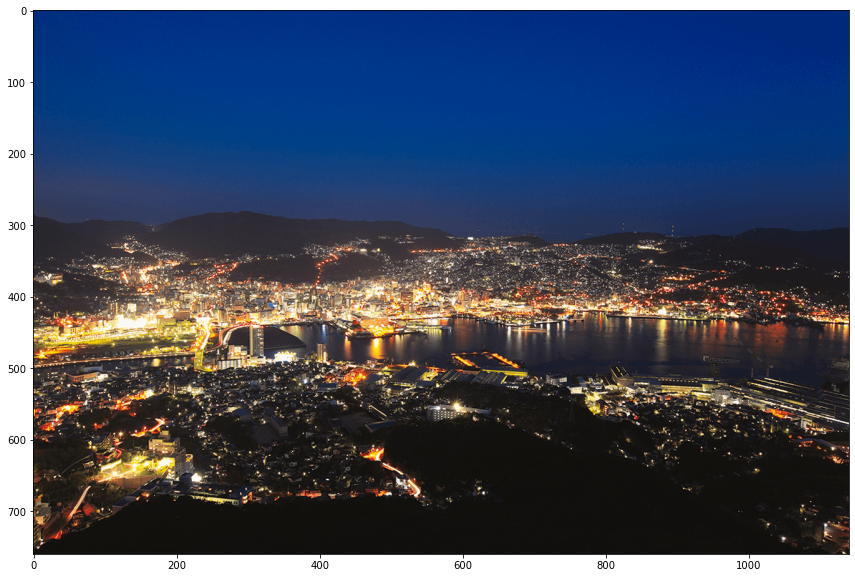

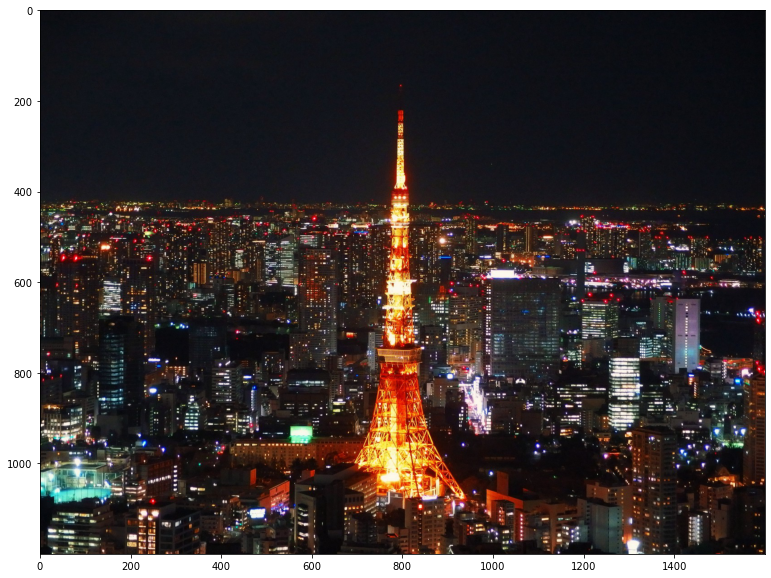

In [44]:

    
def classify_day_night(bgr_image):
    gs = cv2.cvtColor(bgr_image.copy(), cv2.COLOR_BGR2GRAY)
    hist = cv2.calcHist([gs], [0], None, [255],[0,255])
    dark_saturation = hist[0:50]
    light_saturation = hist[50:]
    if np.sum(dark_saturation) > np.sum(light_saturation):
        return "It's Night time"
    else:
        return "It's Day time"


    
for day_img in am_images:
    ip(day_img)
    print(classify_day_night(day_img))
    #x = input("Any key for next image")
    
for night_img in pm_images:
    ip(night_img)
    print(classify_day_night(night_img))
    #x = input("Any key for next image")



### Level 2

#### Image Classifier

1. This should be an easy one, change the classifier so it can also detect night pictures